In [ ]:
!pip install av

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.0/31.0 MB 66.4 MB/s eta 0:00:00


In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import cv2
from fastai.vision.all import *
import warnings
warnings.filterwarnings("ignore")


In [ ]:
# descargamos los datos



In [ ]:
# descomprimimos el zip
!unzip -qq tfm-data.zip -d tfm-data

Archive:  tfm-data.zip
mapname:  conversion of  failed
   creating: tfm-data/videos/
 extracting: tfm-data/target.csv     
 extracting: tfm-data/videos/0X2A904CE88E96E7.avi  
 extracting: tfm-data/videos/0X2CE8B16185B68E.avi  
 extracting: tfm-data/videos/0X1F1B83FF55E4E8.avi  
 extracting: tfm-data/videos/0X2C75C3C43D12BF.avi  
 extracting: tfm-data/videos/0X1F7896620951FFD.avi  
 extracting: tfm-data/videos/0X3DAEE457C2318B8.avi  
 extracting: tfm-data/videos/0X3C63C23E5B0823D.avi  
 extracting: tfm-data/videos/0X2E5EDA11D632F50.avi  
 extracting: tfm-data/videos/0X2F178A2E89C73B5.avi  
 extracting: tfm-data/videos/0X2FFB8AB1CBB7C3D.avi  
 extracting: tfm-data/videos/0X3B08A5A9B4068C8.avi  
 extracting: tfm-data/videos/0X3D8A8864DB8B12E.avi  
 extracting: tfm-data/videos/0X3CA5F8D4ADB6829.avi  
 extracting: tfm-data/videos/0X2BD5CA404CF4822.avi  
 extracting: tfm-data/videos/0X2AD46881C37E12F.avi  
 extracting: tfm-data/videos/0X2D604D85FE921D9.avi  
 extracting: tfm-data/videos/0X2A

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


In [ ]:
ls

gdrive/  sample_data/  tfm-data/  tfm-data.zip


In [ ]:
# cargamos el dataset con el FEVI por cada video
df = pd.read_csv('tfm-data/target.csv')
df.head()

,FileName,FEVI
0,0X1A030EFDD45062FA,44.485700
1,0X1A05829AEDF6C65,64.078050
2,0X1A05DFFFCAFB253B,65.143601
3,0X1A09BE7969DA1508,69.566347
4,0X1A0A263B22CCD966,65.454529


In [ ]:
# # asignamos target 1 a pacientes con FEVI < 50
df['target'] = np.where(df['FEVI'] < 50, 1, 0)
df['target'].value_counts()

0    1151
1     329
Name: target, dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1480 entries, 0 to 1479
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   FileName  1480 non-null   object 
 1   FEVI      1480 non-null   float64
 2   target    1480 non-null   int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 34.8+ KB


In [ ]:
# vamos a trabajar en el directorio en el que están los datos
%cd ./tfm-data

/content/tfm-data


In [ ]:
# usamos Path para acceder más fácilmente
data_path = Path('./videos')
data_path.ls()

(#1480) [Path('videos/0X3BE346AF6B1F7F3D.avi'),Path('videos/0X1E50146E7EAFF53E.avi'),Path('videos/0X3DC771421B48F300.avi'),Path('videos/0X3C05A6B4BBA623EB.avi'),Path('videos/0X3ADFA6B8CB1E4B50.avi'),Path('videos/0X2BCB6F4D73191177.avi'),Path('videos/0X2EC3E1044DE5412D.avi'),Path('videos/0X3B2972B434AE6A78.avi'),Path('videos/0X3BA6403DB9C2AD71.avi'),Path('videos/0X2FD13114B6B7BA39.avi')...]

In [ ]:
# con get_files obtenemos referencias a los ficheros de los videos
video_paths = get_files(data_path, extensions='.avi')
video_paths[0:4]

(#4) [Path('videos/0X3BE346AF6B1F7F3D.avi'),Path('videos/0X1E50146E7EAFF53E.avi'),Path('videos/0X3DC771421B48F300.avi'),Path('videos/0X3C05A6B4BBA623EB.avi')]

In [ ]:
video_paths[0]

Path('videos/0X3BE346AF6B1F7F3D.avi')

In [ ]:
import av

In [ ]:
!rm -r /content/tfm-data/frames

In [ ]:
# creamos un nuevo directorio para las frames
path_frames = Path('/content/tfm-data')/'frames'
if not path_frames.exists(): path_frames.mkdir()

In [ ]:
path_frames

Path('/content/tfm-data/frames')

In [ ]:
# función que extrae y salva frames de un video, downsampling a "sample_freq" por segundo
def avi2frames(video_path, path_frames=path_frames, start_frame=30, max_frames=40): # sample_freq=10
    dest_path = path_frames/video_path.stem
    # print(str(dest_path))
    dest_path.mkdir(parents=True, exist_ok=True)
    video = av.open(str(video_path))
    #if int(video.streams[0].average_rate) < 50:
    #  print(f"fps: {video.streams[0].average_rate}")
    #  return
    frames = [frame.to_image().convert("L") for frame in video.decode(0)]
    # calculamos k para samplear sample_freq frames por segundo
    # k = max(round(int(video.streams[0].average_rate) / sample_freq), 1)
    # sampled_frames = frames[::k]
    for i, frame in enumerate(frames[start_frame:(start_frame + max_frames)]):
        frame.save(dest_path/f'{i}.png')

In [ ]:
avi2frames(video_paths[0], path_frames=path_frames, start_frame=30, max_frames=120)

In [ ]:
parallel(avi2frames, video_paths, start_frame=10)

(#1480) [None,None,None,None,None,None,None,None,None,None...]

In [ ]:
len(path_frames.ls())

1480

In [ ]:
# definimos una función que devuelva las frames ordenadas
@patch
def ls_sorted(self:Path):
    "ls but sorts files by name numerically"
    return self.ls().sorted(key=lambda f: int(f.with_suffix('').name))

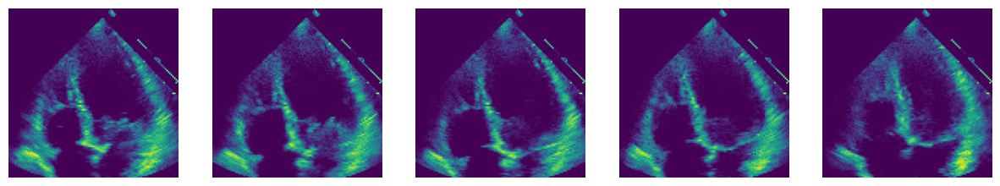

In [ ]:
show_images([Image.open(img) for img in path_frames.ls()[0].ls_sorted()[0:25:5]])

In [ ]:
df[df['target'] == 1].head()

,FileName,FEVI,target
0,0X1A030EFDD45062FA,44.485700,1
18,0X1A494FC3B214947B,45.225940,1
20,0X1A58B506ED05C1D4,32.999338,1
29,0X1A8797C532A3F0EF,29.537739,1
33,0X1A9827D58AC404D1,32.034980,1


In [ ]:
# generamos una mascara que muestre los pixels por encima de un umbral a 1, y el resto a 0
def frame_mask(img, thresh=30):
  return cv2.threshold(src=img, thresh=thresh, maxval=255, type=cv2.THRESH_BINARY)[1]

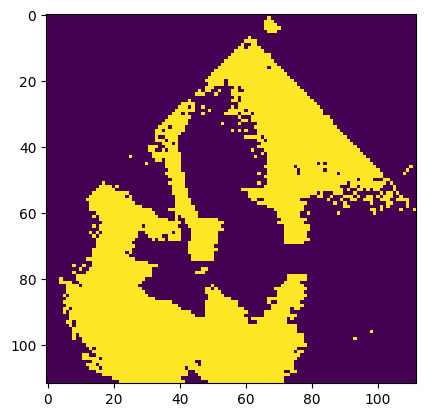

In [ ]:
frame = cv2.imread(str((path_frames/'0X1A8797C532A3F0EF').ls()[10]), cv2.IMREAD_GRAYSCALE)
thresh_frame = frame_mask(frame)
plt.imshow(thresh_frame)

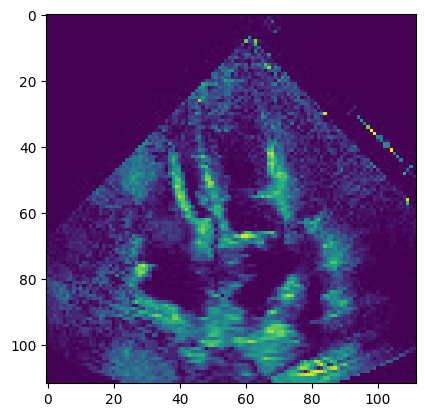

In [ ]:
frames = []
frame2 = cv2.imread(str((path_frames/'0X3A76AD5CC9D50E57').ls()[15]), cv2.IMREAD_GRAYSCALE)
diff_frame = cv2.absdiff(frame, frame2)
plt.imshow(diff_frame)

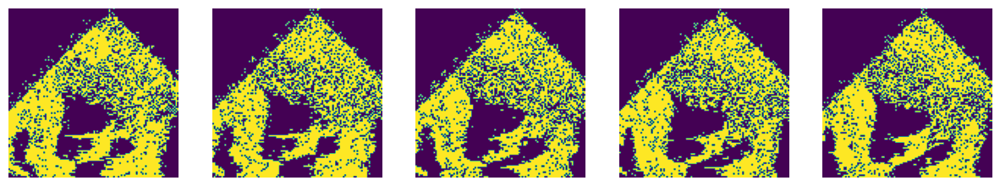

In [ ]:
video_id = df[df['FEVI'] < 40]['FileName'].values[15]
previous = None
frames = []
for idx in range(10, 40, 5):
  frame = cv2.imread(str((path_frames/video_id).ls_sorted()[idx]), cv2.IMREAD_GRAYSCALE)
  if previous is None:
    previous = frame.copy()
    continue

  diff_frame = cv2.absdiff(previous, frame)
  frames.append(frame_mask(diff_frame, thresh=4))
  previous = frame.copy()

show_images(frames)

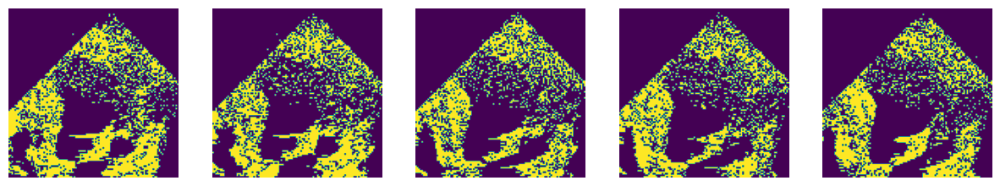

In [ ]:
video_id = df[df['FEVI'] < 40]['FileName'].values[15]
previous = None
frames = []
for idx in range(10, 40, 5):
  frame = cv2.imread(str((path_frames/video_id).ls_sorted()[idx]), cv2.IMREAD_GRAYSCALE)
  if previous is None:
    previous = frame.copy()
    continue

  diff_frame = cv2.absdiff(previous, frame)
  frames.append(frame_mask(diff_frame, thresh=10))
  previous = frame.copy()

show_images(frames)

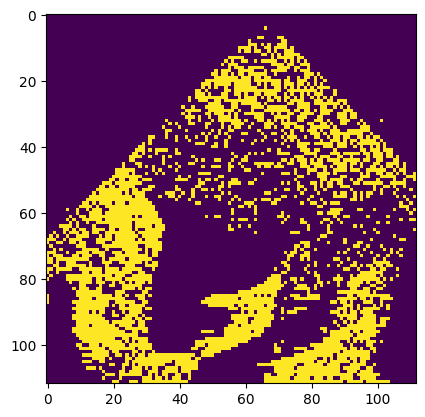

In [ ]:
frame = cv2.imread(str((path_frames/video_id).ls()[10]), cv2.IMREAD_GRAYSCALE)
plt.imshow(frame_mask(diff_frame, thresh=10))

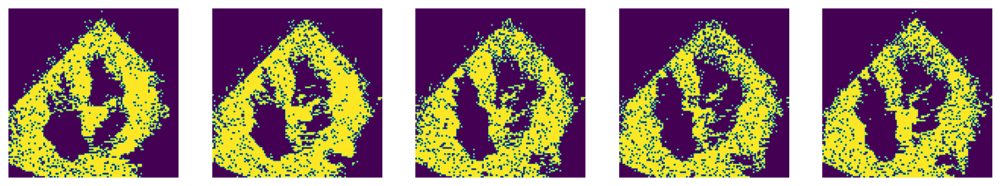

In [ ]:
video_id = df[df['FEVI'] > 60]['FileName'].values[100]
previous = None
frames = []
for idx in range(10, 40, 5):
  frame = cv2.imread(str((path_frames/video_id).ls_sorted()[idx]), cv2.IMREAD_GRAYSCALE)
  if previous is None:
    previous = frame.copy()
    continue

  diff_frame = cv2.absdiff(previous, frame)
  frames.append(frame_mask(diff_frame, thresh=5))
  previous = frame.copy()

show_images(frames)

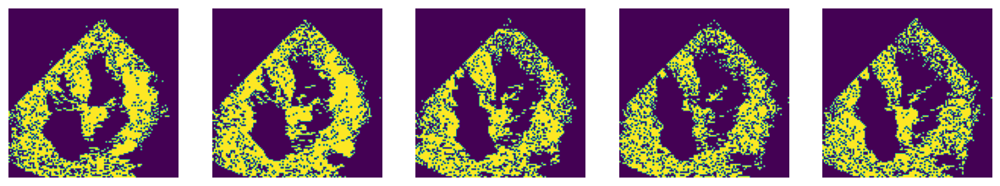

In [ ]:
video_id = df[df['FEVI'] > 60]['FileName'].values[100]
previous = None
frames = []
for idx in range(10, 40, 5):
  frame = cv2.imread(str((path_frames/video_id).ls_sorted()[idx]), cv2.IMREAD_GRAYSCALE)
  if previous is None:
    previous = frame.copy()
    continue

  diff_frame = cv2.absdiff(previous, frame)
  frames.append(frame_mask(diff_frame, thresh=10))
  previous = frame.copy()

show_images(frames)

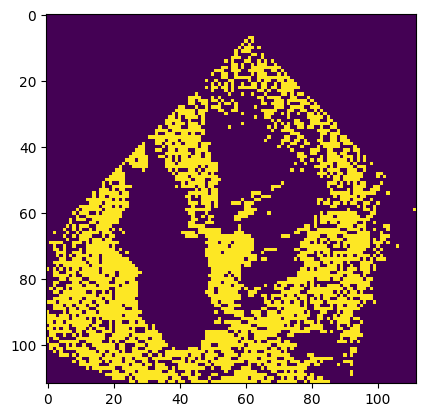

In [ ]:
frame = cv2.imread(str((path_frames/video_id).ls()[10]), cv2.IMREAD_GRAYSCALE)
plt.imshow(frame_mask(diff_frame, thresh=10))

In [ ]:
lag = 4
fps = 50
lag_ms = 80

In [ ]:
lag * (1000 / fps) == 80



True

In [ ]:
lag = lag_ms * fps // 1000
lag

4

In [ ]:
10

50.0

In [ ]:
def extract_diff_frames(video_path, lag=5, thresh=10):
  cap = cv2.VideoCapture(str(video_path))

  if not cap.isOpened():
      print("Error opening video file")

  frames = []
  diff_frames = []
  frame_idx = -1

  while True:
    ret, frame = cap.read()
    if not ret:
        break

    # extraer frame y generar mascara
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    frames.append(frame.copy())
    frame_idx += 1

    if frame_idx < lag:
      # necesitamos al menos lag frames para empezar
      continue

    # print(f"idx: {frame_idx}")
    # calculamos diferencia de frame_idx con lag
    diff_frame = cv2.absdiff(frames[frame_idx - lag], frame)
    # creamos una mascara para mostrar cambios por encima del umbral
    diff_frame = cv2.threshold(src=diff_frame, thresh=thresh, maxval=255, type=cv2.THRESH_BINARY)[1]
    diff_frames.append(diff_frame.copy())

  return diff_frames


In [ ]:
# función que extrae y salva frames de un video, downsampling a "sample_freq" por segundo
def avi2frames(video_path, path_frames=path_frames, start_frame=0, max_frames=60): # sample_freq=10
    dest_path = path_frames/video_path.stem
    # print(str(dest_path))
    dest_path.mkdir(parents=True, exist_ok=True)

    frames = extract_diff_frames(video_path, lag=5, thresh=30)
    for i, frame in enumerate(frames[start_frame:(start_frame + max_frames)]):
        cv2.imwrite(str(dest_path/f'{i}.png'), frame)

In [ ]:
video_paths[0]

Path('videos/0X3EB0FC2695B0AB5F.avi')

In [ ]:
# vamos a probar con un caso con FEVI por encima de 60

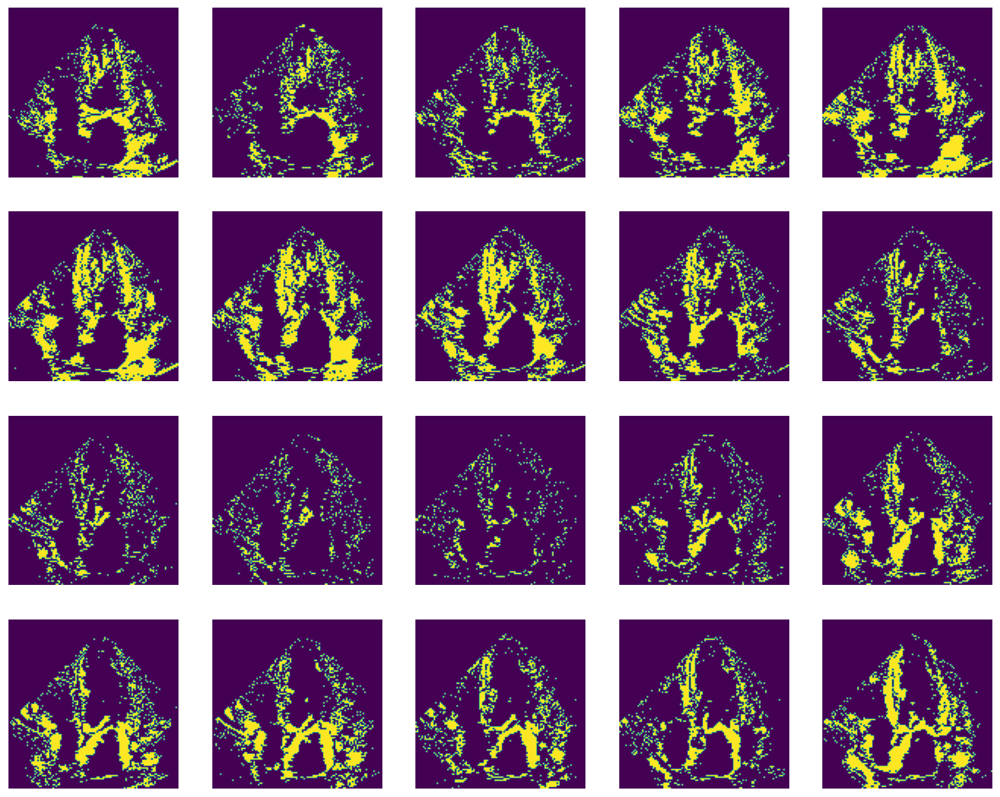

In [ ]:
video_path = (data_path/df[df['FEVI'] > 55]['FileName'].values[1]).with_suffix('.avi')

frames = extract_diff_frames(video_path, lag=10, thresh=40)
show_images(frames[10:50:2], nrows=4)

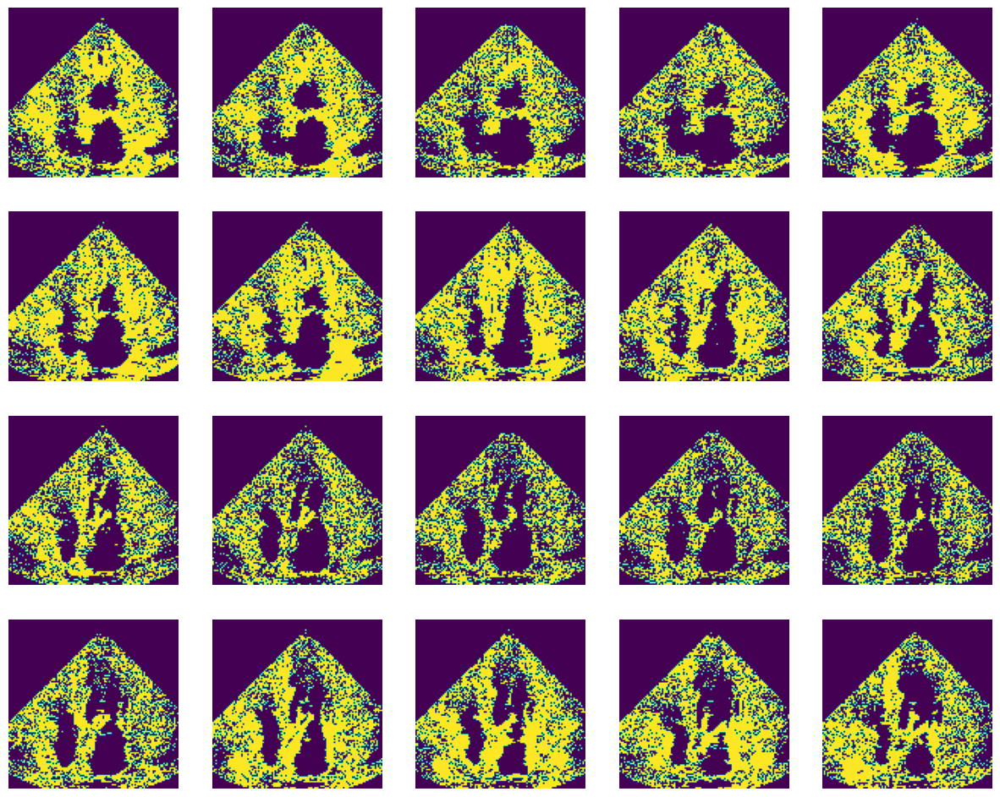

In [ ]:
video_path = (data_path/df[df['FEVI'] > 55]['FileName'].values[1]).with_suffix('.avi')

frames = extract_diff_frames(video_path, lag=5, thresh=10)
show_images(frames[10:50:2], nrows=4)

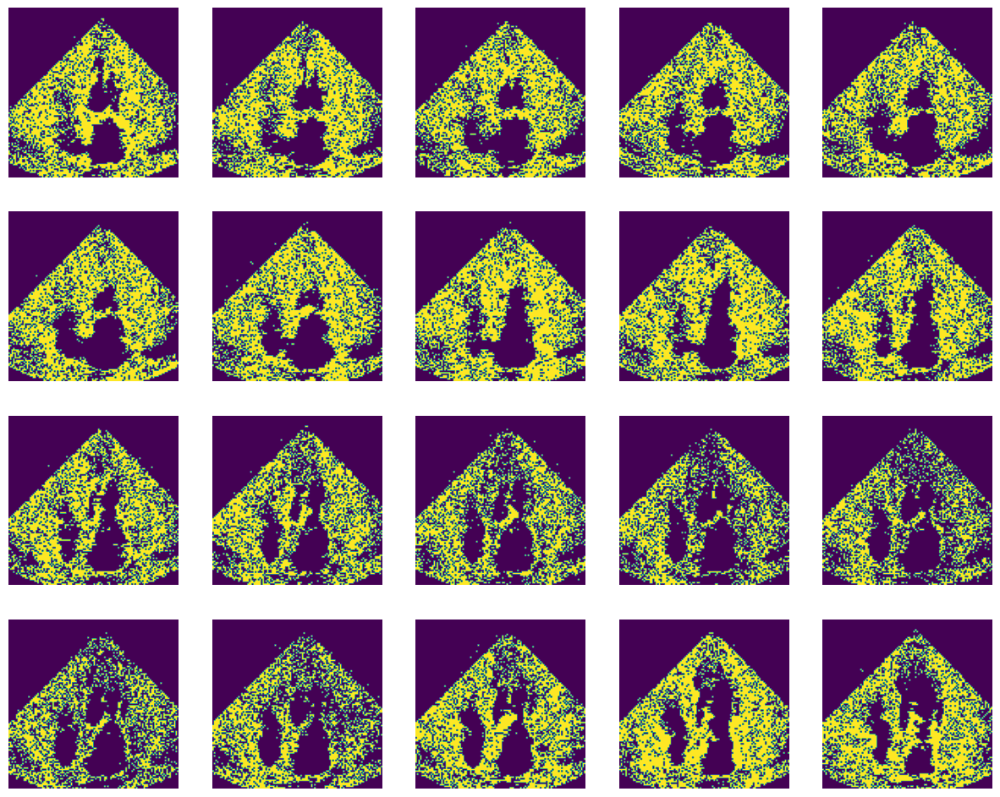

In [ ]:
video_path = (data_path/df[df['FEVI'] > 55]['FileName'].values[1]).with_suffix('.avi')

frames = extract_diff_frames(video_path, lag=1, thresh=5)
show_images(frames[10:50:2], nrows=4)

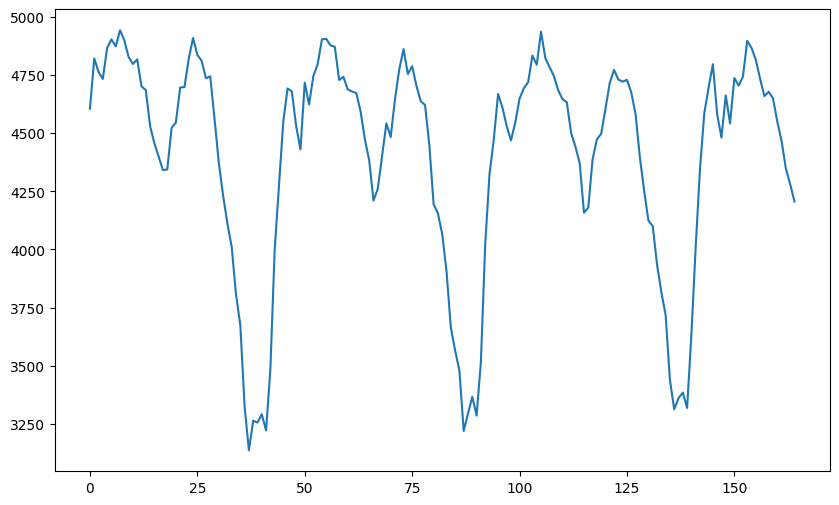

In [ ]:
non_zero_counts = []

for _, img in enumerate(frames):
    non_zero_counts.append(cv2.countNonZero(img))

len(non_zero_counts)

img_idx = list(range(len(frames)))

plt.figure(figsize=(10, 6))
plt.plot(img_idx, non_zero_counts)

In [ ]:
(np.max(non_zero_counts[25:75]) - np.min(non_zero_counts[25:75])) / np.max(non_zero_counts[25:75])

0.3604485219164118

In [ ]:
# Ahora probamos con un caso por debajo de 40

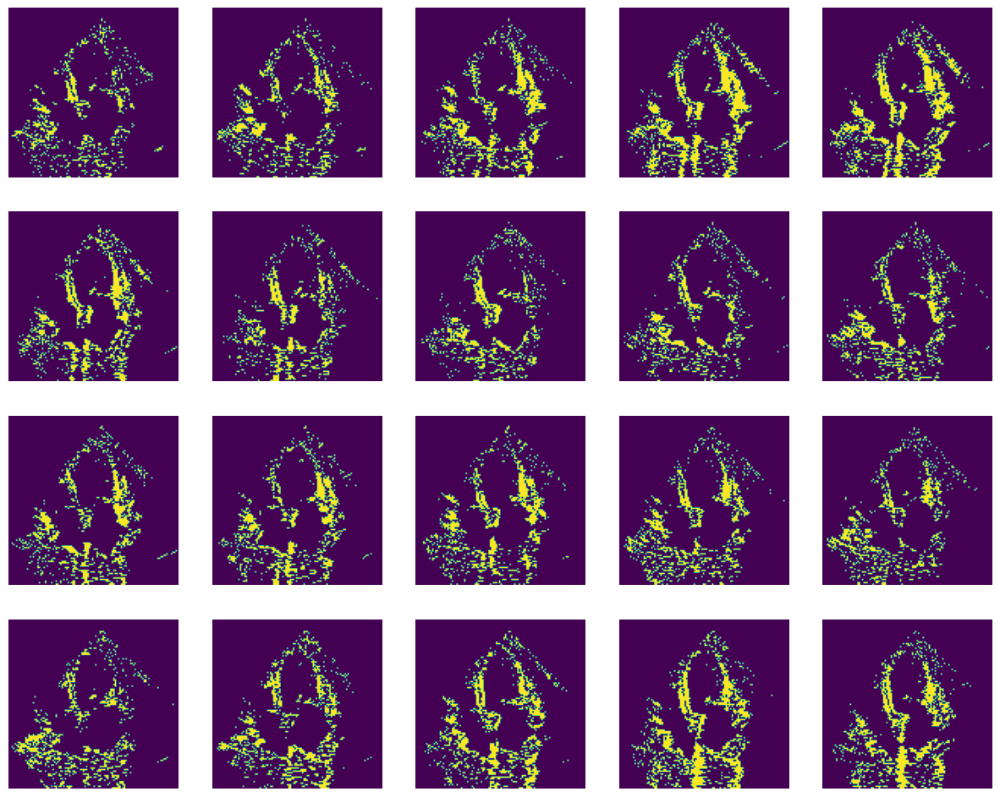

In [ ]:
video_path = (data_path/df[df['FEVI'] < 40]['FileName'].values[1]).with_suffix('.avi')

frames = extract_diff_frames(video_path, lag=10, thresh=40)
show_images(frames[10:50:2], nrows=4)

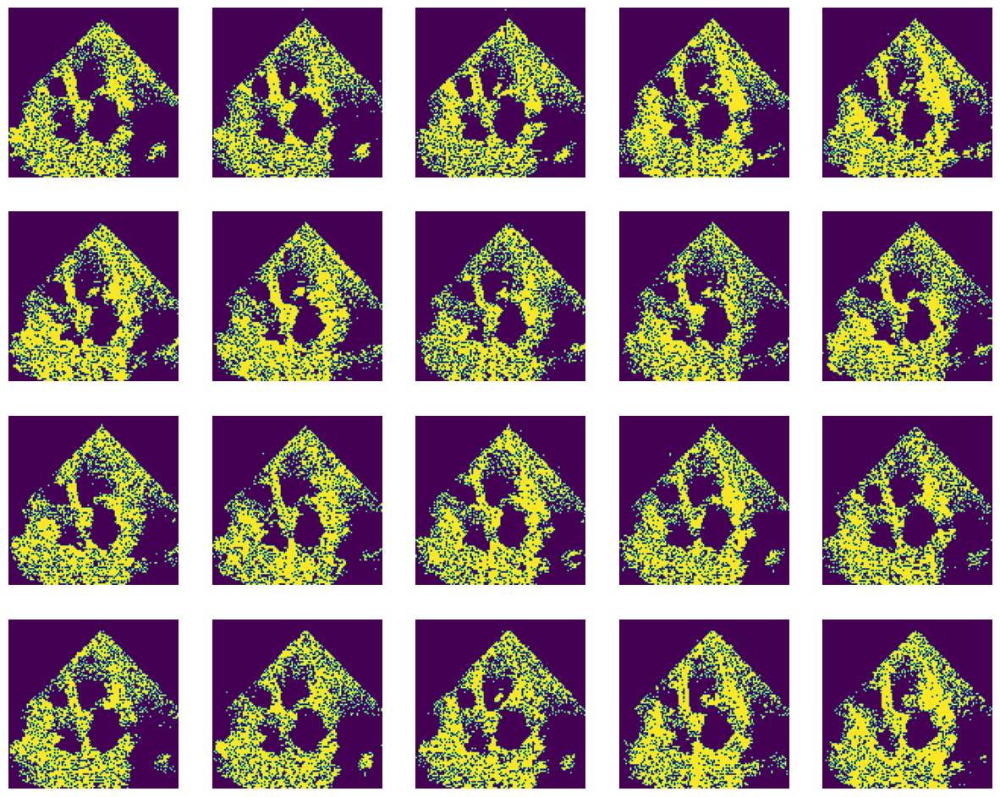

In [ ]:
video_path = (data_path/df[df['FEVI'] < 40]['FileName'].values[1]).with_suffix('.avi')

frames = extract_diff_frames(video_path, lag=5, thresh=10)
show_images(frames[10:50:2], nrows=4)

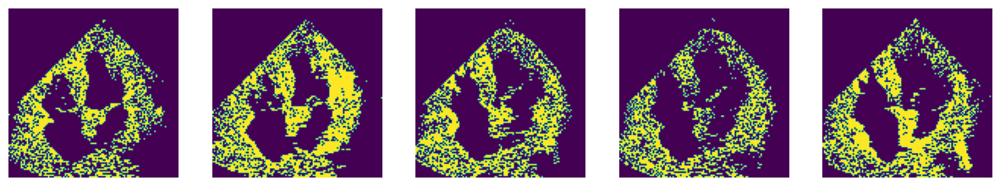

In [ ]:
video_path = (data_path/df[df['FEVI'] > 60]['FileName'].values[100]).with_suffix('.avi')

frames = extract_diff_frames(video_path, lag=4, thresh=15)
show_images(frames[15:50:7])

In [ ]:
len((path_frames/df[df['FEVI'] > 60]['FileName'].values[100]).ls_sorted())

40

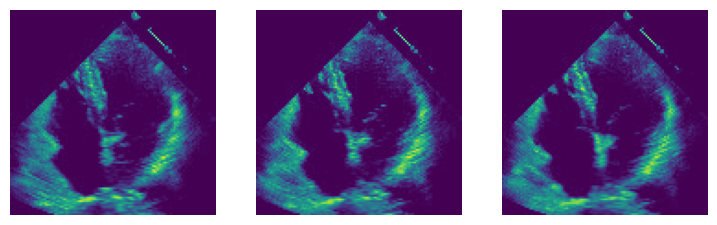

In [ ]:
show_images([Image.open(img) for img in (path_frames/df[df['FEVI'] > 60]['FileName'].values[100]).ls_sorted()[20:60:7]])

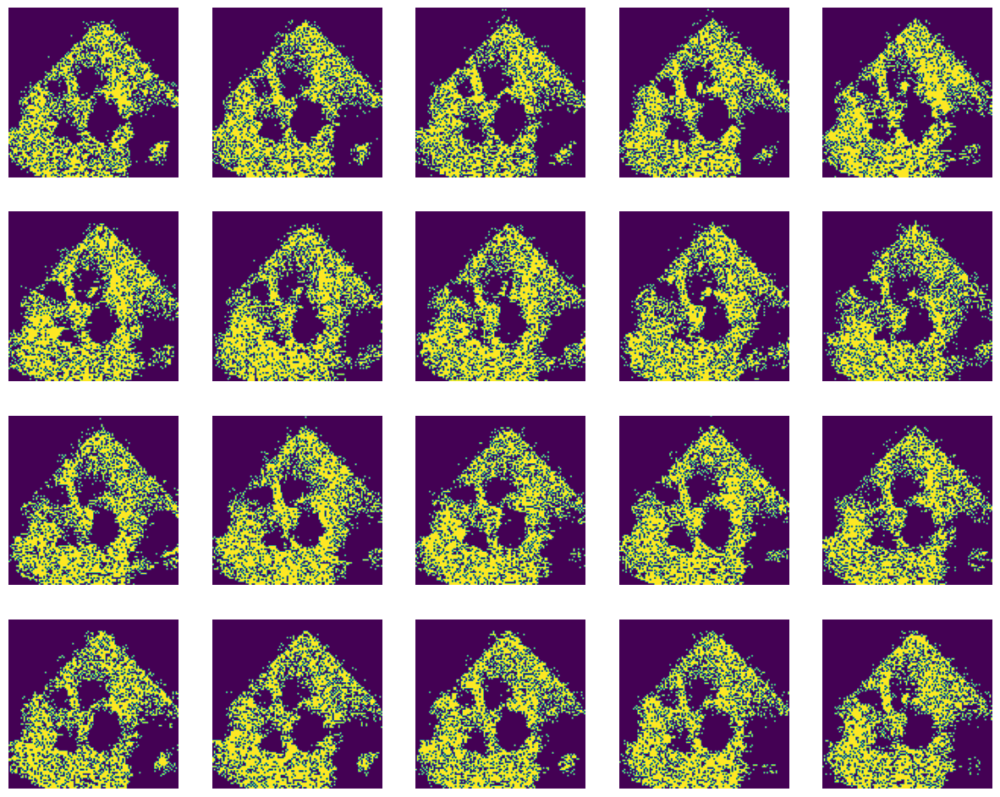

In [ ]:
video_path = (data_path/df[df['FEVI'] < 40]['FileName'].values[1]).with_suffix('.avi')

frames = extract_diff_frames(video_path, lag=1, thresh=5)
show_images(frames[10:50:2], nrows=4)

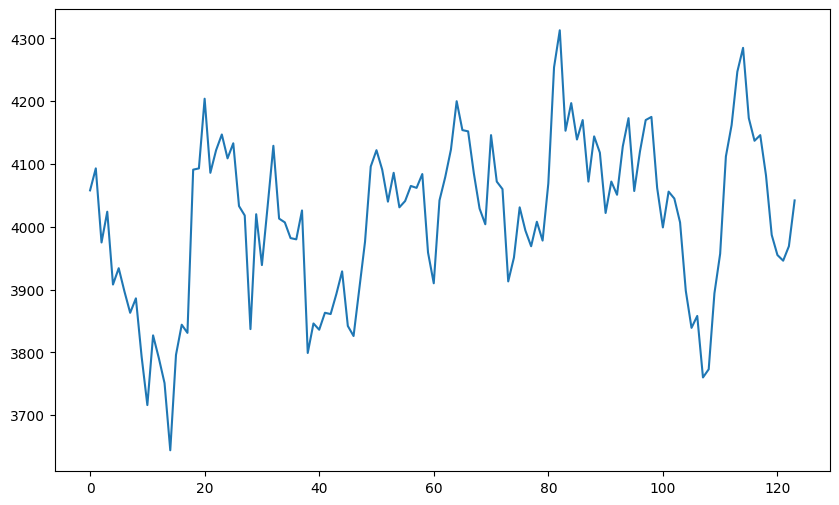

In [ ]:
non_zero_counts = []

for _, img in enumerate(frames):
    non_zero_counts.append(cv2.countNonZero(img))

len(non_zero_counts)

img_idx = list(range(len(frames)))

plt.figure(figsize=(10, 6))
plt.plot(img_idx, non_zero_counts)

In [ ]:
(np.max(non_zero_counts[40:80]) - np.min(non_zero_counts[40:80])) / np.max(non_zero_counts[40:80])

0.08904761904761904

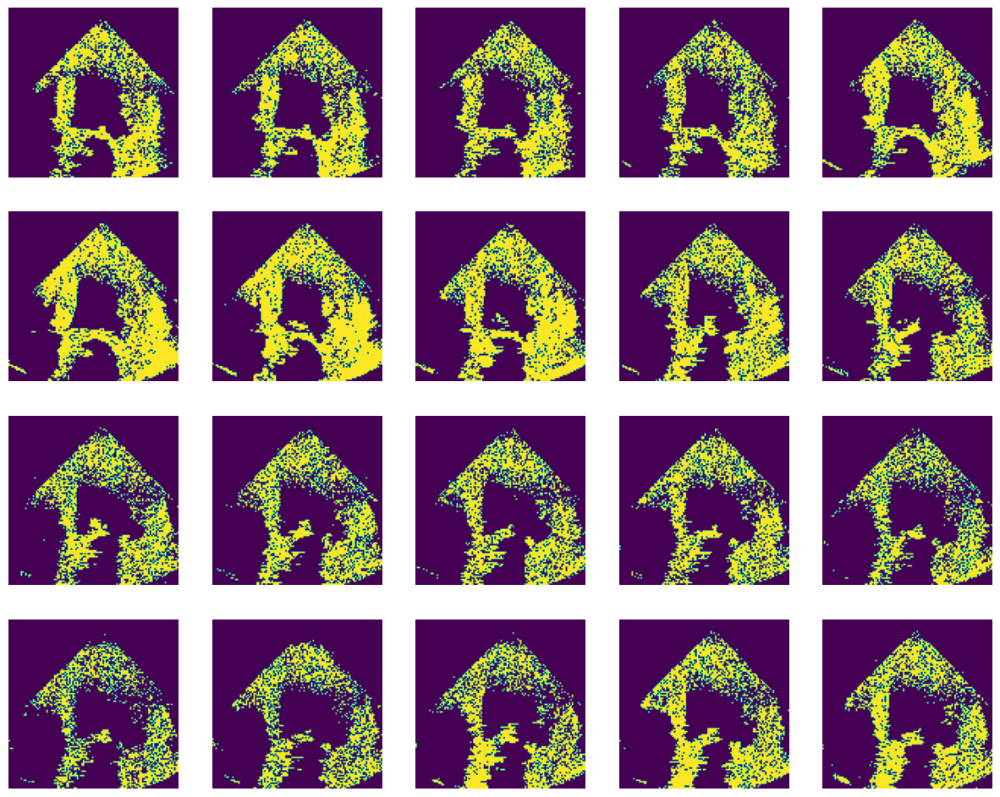

In [ ]:
video_path = (data_path/df[df['FEVI'] < 30]['FileName'].values[2]).with_suffix('.avi')

frames = extract_diff_frames(video_path, lag=5, thresh=10)
show_images(frames[10:50:2], nrows=4)

In [ ]:
df2 = pd.read_csv("/content/gdrive/MyDrive/TFM/target_metadata.csv")
df2.head()

,Unnamed: 0,FileName,FEVI,target,FEVI10,frame_rate,frames,duration
0,0,0X1A030EFDD45062FA,44.485700,1,4.0,50,157,3.14
1,1,0X1A05829AEDF6C65,64.078050,0,6.0,50,178,3.56
2,2,0X1A05DFFFCAFB253B,65.143601,0,6.0,50,166,3.32
3,3,0X1A09BE7969DA1508,69.566347,0,6.0,50,149,2.98
4,4,0X1A0A263B22CCD966,65.454529,0,6.0,50,140,2.80


In [ ]:
df2[df2['frame_rate'] < 45]['FEVI10'].value_counts()

6.0    16
5.0    13
2.0     6
3.0     5
4.0     4
1.0     3
7.0     1
Name: FEVI10, dtype: int64

In [ ]:
df2[df2['frame_rate'] > 55]['FEVI10'].value_counts()

6.0    63
5.0    46
4.0    13
3.0     8
2.0     6
7.0     5
1.0     2
Name: FEVI10, dtype: int64

In [ ]:
df2[df2['frame_rate'] < 40].head()

,Unnamed: 0,FileName,FEVI,target,FEVI10,frame_rate,frames,duration
52,52,0X1ADEAFA4D59610C8,63.462586,0,6.0,30,102,3.400000
150,150,0X1BDE353AD84F913D,68.066702,0,6.0,33,197,5.969697
185,185,0X1C8054277A139381,62.211073,0,6.0,28,81,2.892857
198,198,0X1CAD9DE1F782AF55,65.902354,0,6.0,27,63,2.333333
215,215,0X1CEBFD3654DFE9D3,48.016634,1,4.0,35,94,2.685714


In [ ]:
video_id = '0X1BDE353AD84F913D'
video_path = (data_path/video_id).with_suffix('.avi')


In [ ]:
cap = cv2.VideoCapture(str(video_path))
fps = cap.get(cv2.CAP_PROP_FPS)
fps

33.0

In [ ]:
lag_ms = 100
lag = int(lag_ms * fps // 1000)
lag

3

In [ ]:
lag * fps

99.0

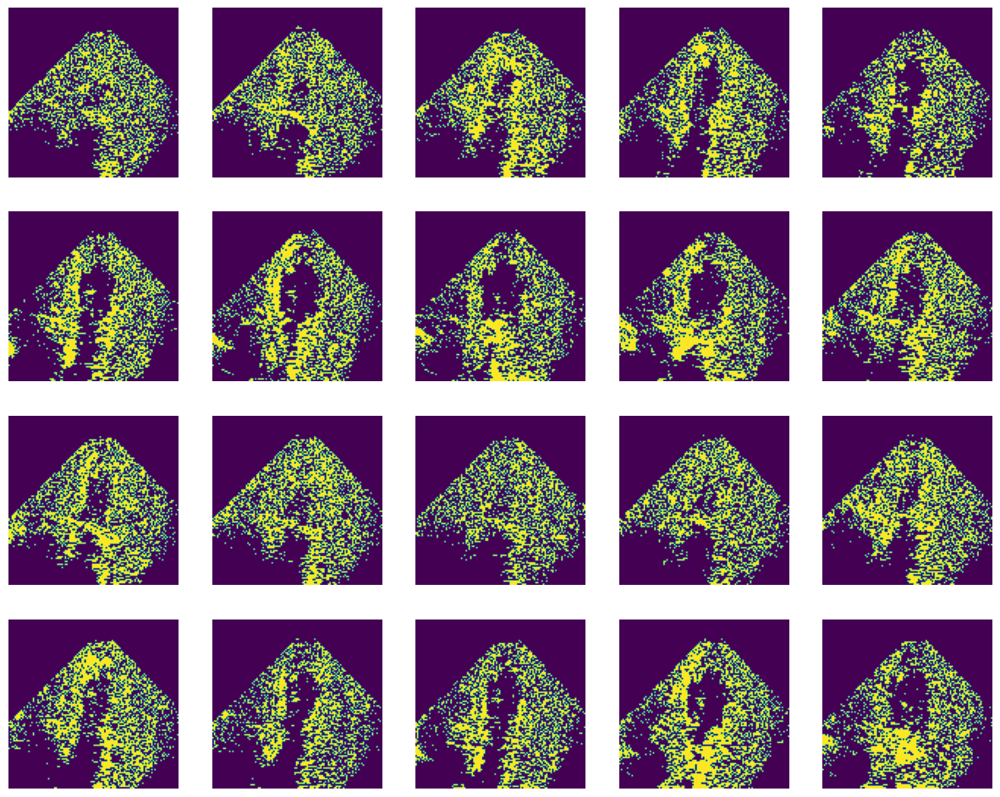

In [ ]:
frames = extract_diff_frames(video_path, lag=lag, thresh=20)
show_images(frames[10:50:2], nrows=4)

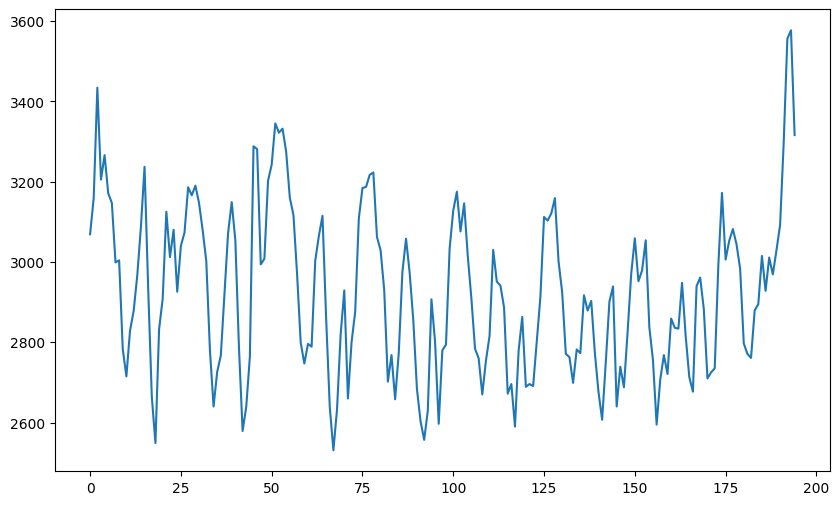

In [ ]:
non_zero_counts = []

for _, img in enumerate(frames):
    non_zero_counts.append(cv2.countNonZero(img))

len(non_zero_counts)

img_idx = list(range(len(frames)))

plt.figure(figsize=(10, 6))
plt.plot(img_idx, non_zero_counts)

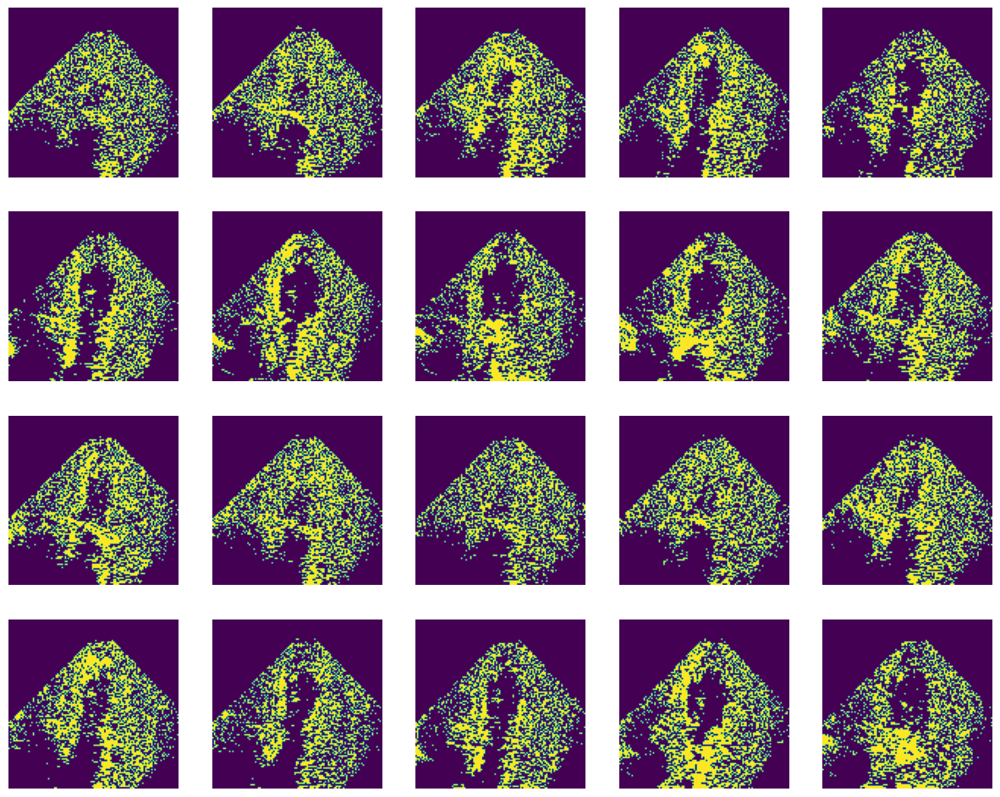

In [ ]:
lag_ms = 80
lag = int(lag_ms * fps // 1000)


frames = extract_diff_frames(video_path, lag=lag, thresh=20)
show_images(frames[10:50:2], nrows=4)

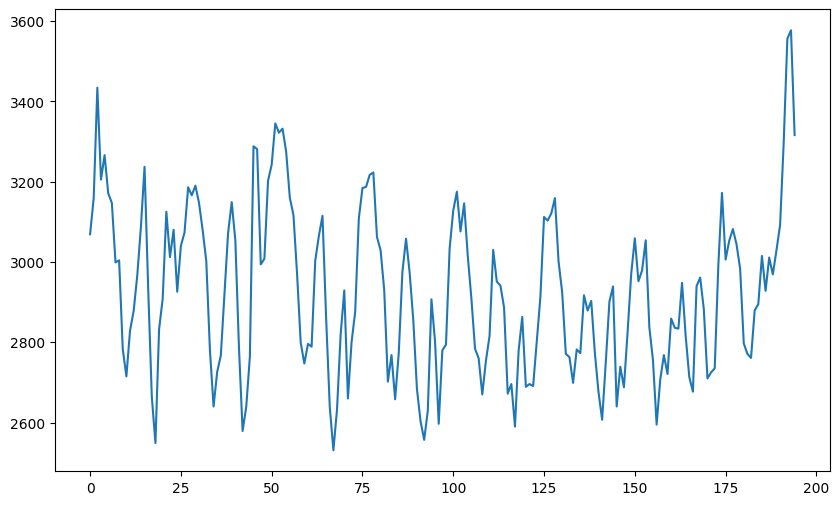

In [ ]:
non_zero_counts = []

for _, img in enumerate(frames):
    non_zero_counts.append(cv2.countNonZero(img))

len(non_zero_counts)

img_idx = list(range(len(frames)))

plt.figure(figsize=(10, 6))
plt.plot(img_idx, non_zero_counts)

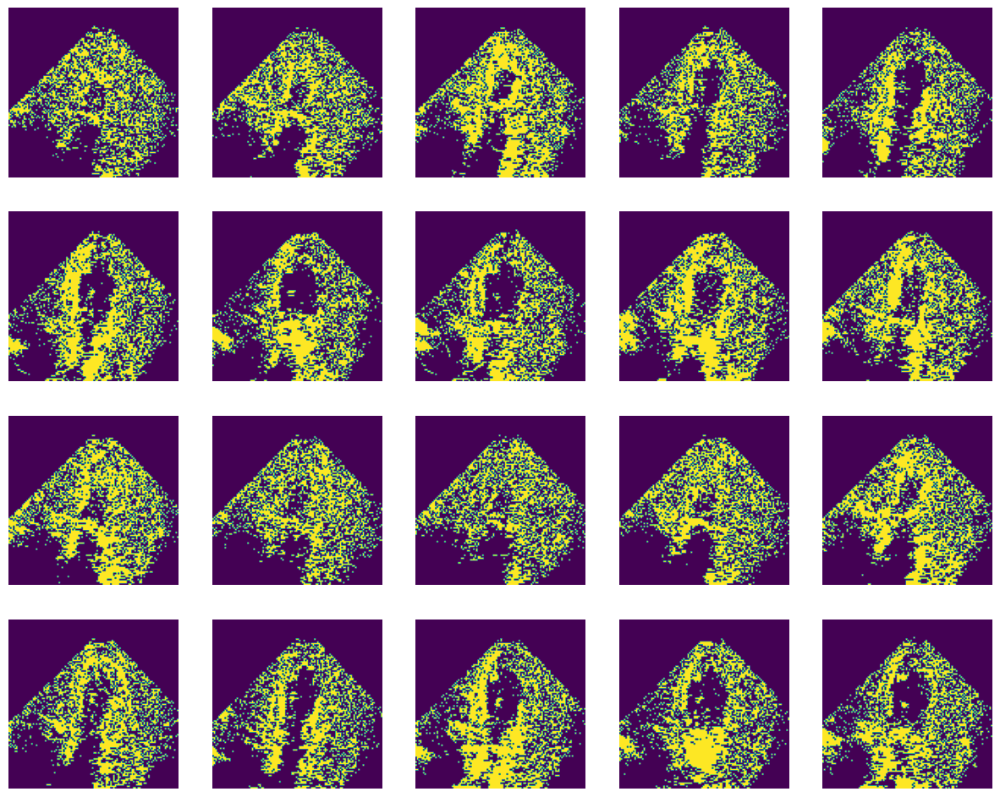

In [ ]:
frames = extract_diff_frames(video_path, lag=4, thresh=20)
show_images(frames[10:50:2], nrows=4)

In [ ]:
4 * 1000 / fps

121.21212121212122

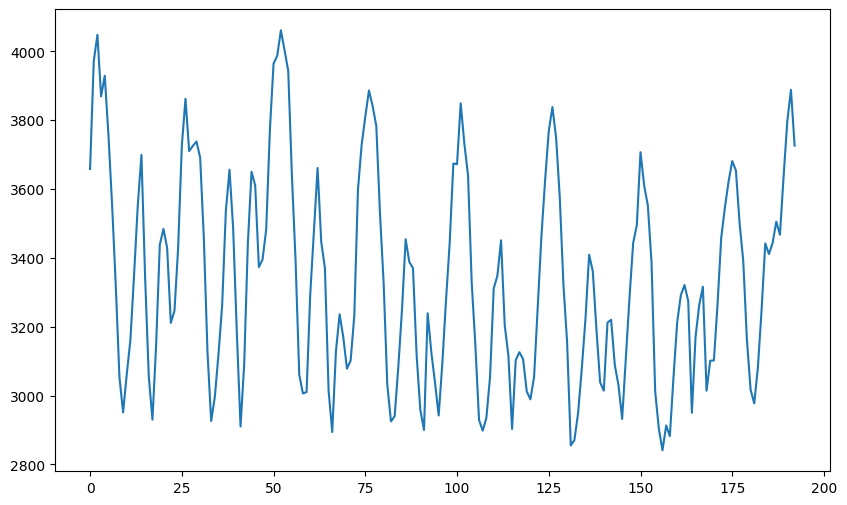

In [ ]:
non_zero_counts = []

for _, img in enumerate(frames):
    non_zero_counts.append(cv2.countNonZero(img))

len(non_zero_counts)

img_idx = list(range(len(frames)))

plt.figure(figsize=(10, 6))
plt.plot(img_idx, non_zero_counts)

In [ ]:
df2['fr10'] = df2['frame_rate'] // 10

In [ ]:
df2['fr10'].value_counts()

5     1293
4       67
6       49
7       21
3       17
8       15
2       10
10       5
9        2
11       1
Name: fr10, dtype: int64

In [ ]:
df2[df2['frame_rate'] > 60].head()

,Unnamed: 0,FileName,FEVI,target,FEVI10,frame_rate,frames,duration,fr10
15,15,0X1A3D565B371DC573,58.833461,0,5.0,116,327,2.818966,11
63,63,0X1AFA6BA6C2E2132C,55.138171,0,5.0,62,276,4.451613,6
85,85,0X1B2BCDAE290F6015,28.412706,1,2.0,76,155,2.039474,7
90,90,0X1B357C0B6C82BB18,61.772006,0,6.0,68,204,3.000000,6
145,145,0X1BCD0AD72ECB908A,55.707396,0,5.0,88,278,3.159091,8


In [ ]:
video_id = '0X1BCD0AD72ECB908A'
video_path = (data_path/video_id).with_suffix('.avi')
cap = cv2.VideoCapture(str(video_path))
fps = cap.get(cv2.CAP_PROP_FPS)
fps

88.0

In [ ]:
4 * 1000 / fps

45.45454545454545

In [ ]:
lag_ms = 100
lag = int(lag_ms * fps // 1000)
lag

8

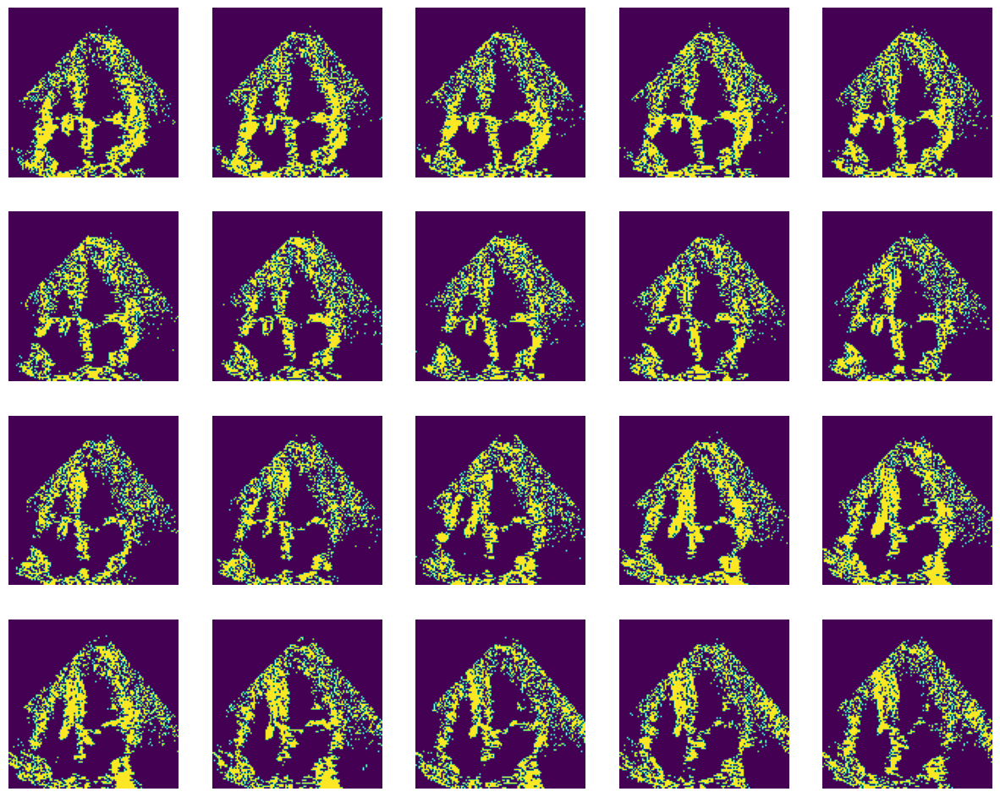

In [ ]:
frames = extract_diff_frames(video_path, lag=lag, thresh=20)
show_images(frames[10:50:2], nrows=4)

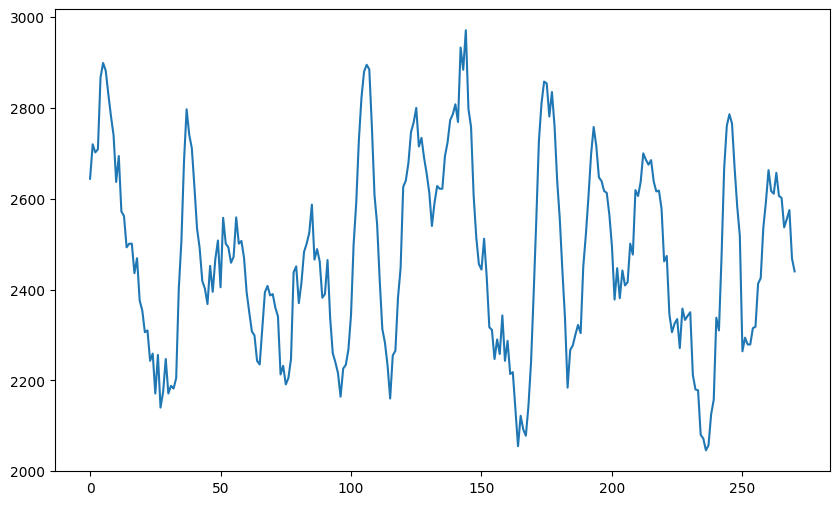

In [ ]:
non_zero_counts = []

for _, img in enumerate(frames):
    non_zero_counts.append(cv2.countNonZero(img))

len(non_zero_counts)

img_idx = list(range(len(frames)))

plt.figure(figsize=(10, 6))
plt.plot(img_idx, non_zero_counts)

In [ ]:
lag_ms = 80
lag = int(lag_ms * fps // 1000)
lag

7

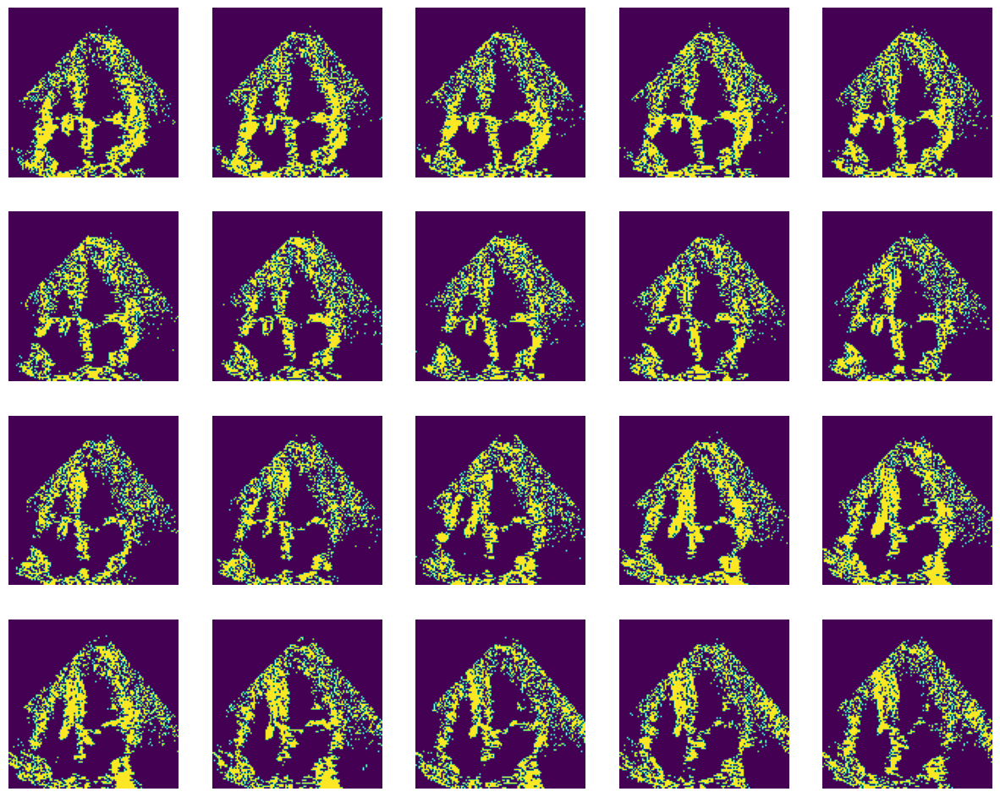

In [ ]:
frames = extract_diff_frames(video_path, lag=lag, thresh=20)
show_images(frames[10:50:2], nrows=4)

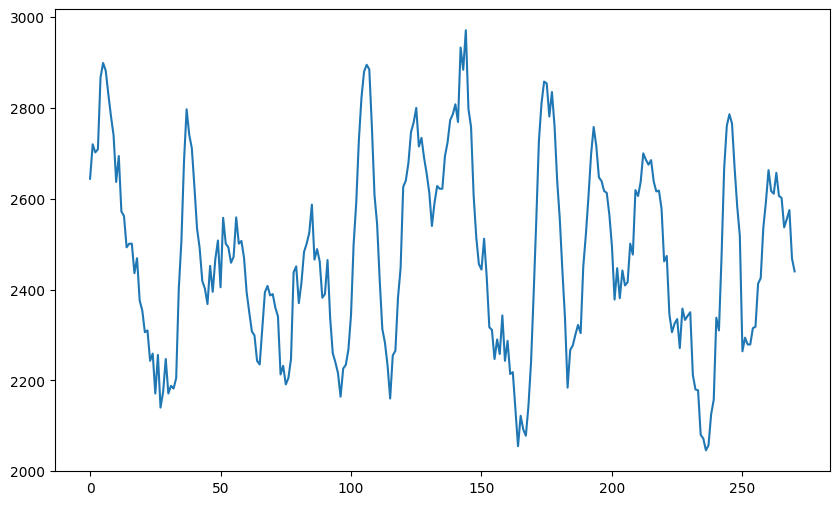

In [ ]:
non_zero_counts = []

for _, img in enumerate(frames):
    non_zero_counts.append(cv2.countNonZero(img))

len(non_zero_counts)

img_idx = list(range(len(frames)))

plt.figure(figsize=(10, 6))
plt.plot(img_idx, non_zero_counts)

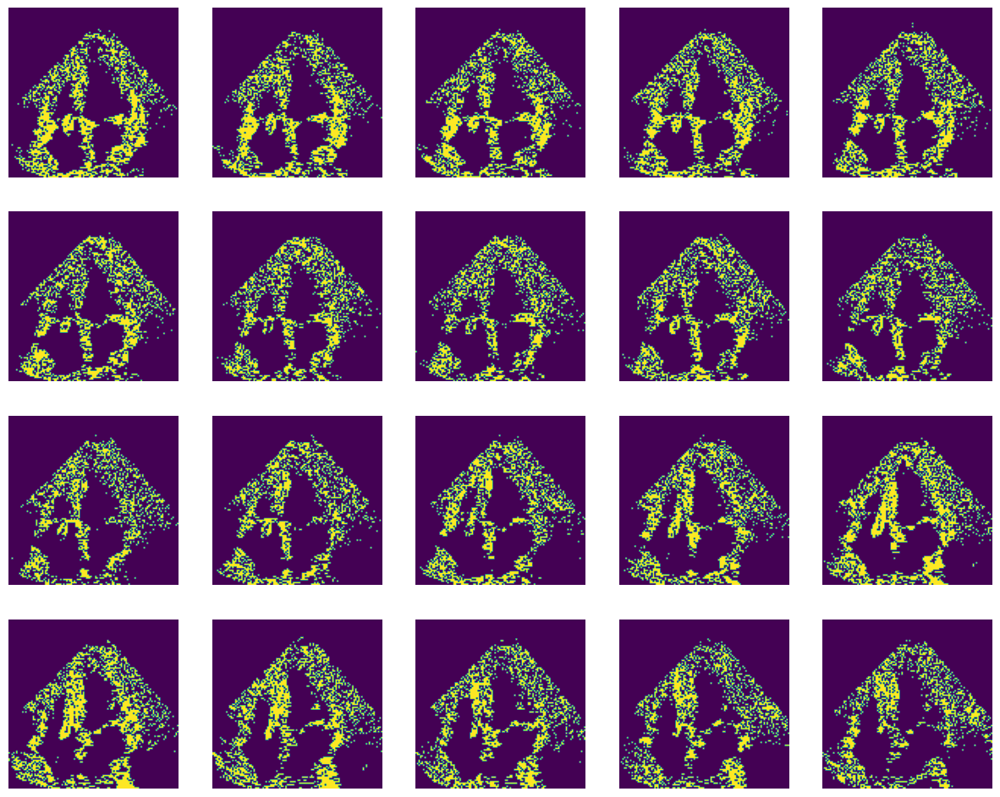

In [ ]:
frames = extract_diff_frames(video_path, lag=4, thresh=20)
show_images(frames[10:50:2], nrows=4)

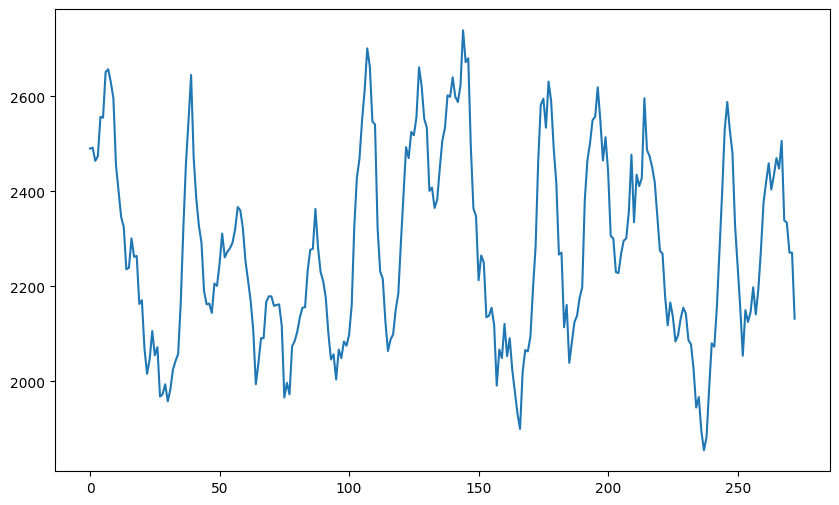

In [ ]:
non_zero_counts = []

for _, img in enumerate(frames):
    non_zero_counts.append(cv2.countNonZero(img))

len(non_zero_counts)

img_idx = list(range(len(frames)))

plt.figure(figsize=(10, 6))
plt.plot(img_idx, non_zero_counts)

In [ ]:
lag_ms = 120
lag = int(lag_ms * fps // 1000)
lag

10

In [ ]:
1000 / 120

8.333333333333334

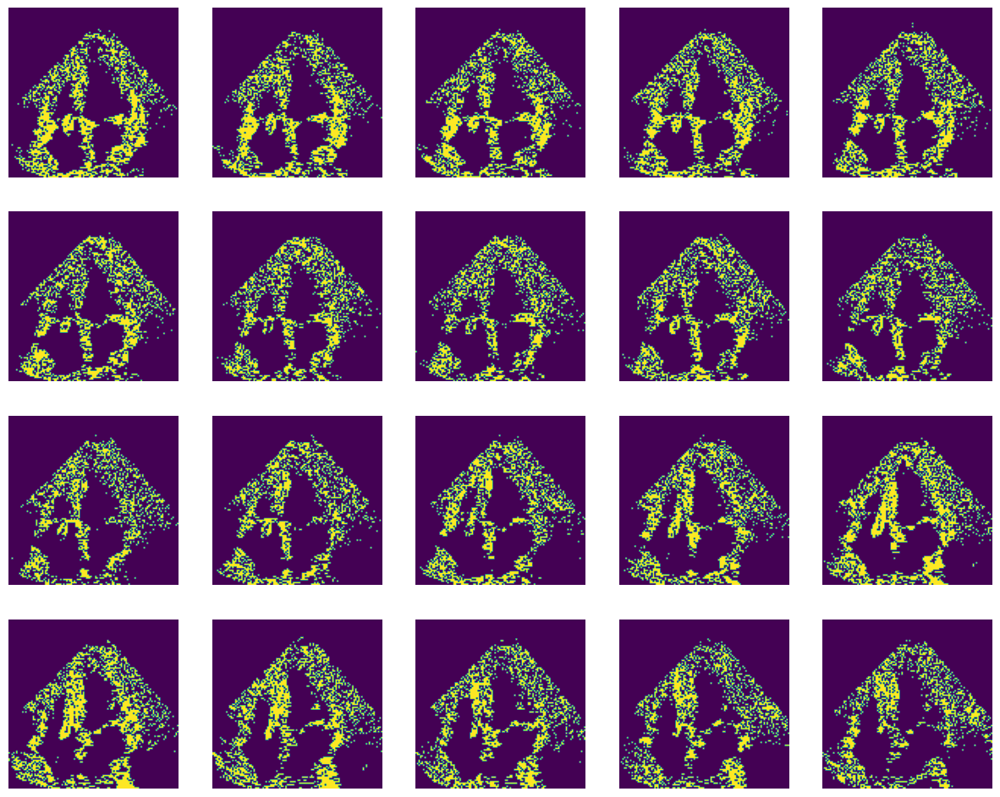

In [ ]:
frames = extract_diff_frames(video_path, lag=4, thresh=20)
show_images(frames[10:50:lag], nrows=4)

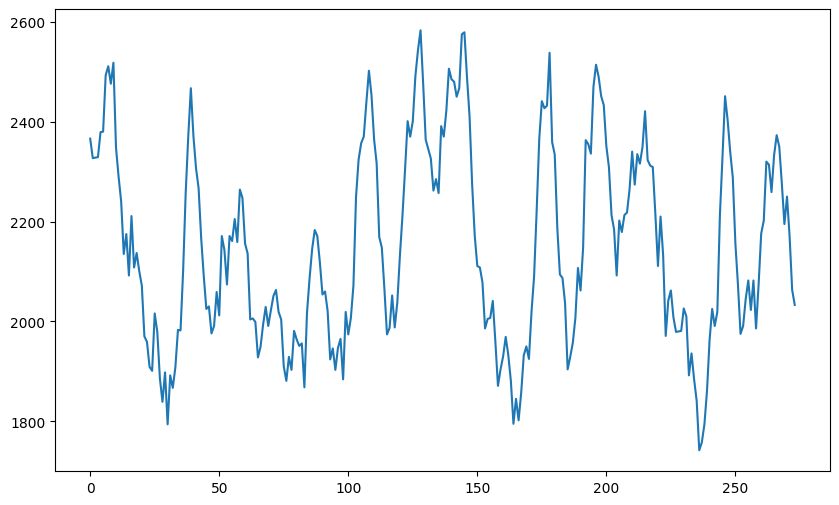

In [ ]:
non_zero_counts = []

for _, img in enumerate(frames):
    non_zero_counts.append(cv2.countNonZero(img))

len(non_zero_counts)

img_idx = list(range(len(frames)))

plt.figure(figsize=(10, 6))
plt.plot(img_idx, non_zero_counts)